In [1]:
!pip install -q transformers datasets
!pip install -q mauve-text

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.3/6.3 MB 32.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 469.0/469.0 KB 23.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.3/190.3 KB 9.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.6/7.6 MB 66.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 132.0/132.0 KB 8.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 213.0/213.0 KB 10.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 140.6/140.6 KB 7.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.0/17.0 MB 59.7 MB/s eta 0:00:00


In [18]:
# !pip install spacy-nightly
!pip install -q spacy
# !pip install spacy-transformers
# !python3 -m spacy download en_core_web_trf

In [19]:
import spacy

/usr/local/lib/python3.8/dist-packages/torch/cuda/__init__.py:497: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")


In [20]:
spacy.cli.download("en_core_web_lg")
nlp = spacy.load("en_core_web_lg")

✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_lg')


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
# select n random samples from the dataset
def get_samples(num, seed_value, dataset):

    # select num samples
    train_samples = dataset['train'].shuffle(seed=seed_value).select(range(num))['text']
    test_samples = dataset['test'].shuffle(seed=seed_value).select(range(num))['text']

    return train_samples, test_samples

In [17]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from statistics import mean

from datasets import load_dataset
import random
import datasets

import mauve
import statistics

from datasets import load_from_disk
from datasets import Dataset

##Metrics

In [5]:
import re

def remove_html_tags(text):    
    clean = re.compile('<.*?>')
    return re.sub(clean, '', text)

In [6]:
import statistics

# cosine similarity
def find_similarity(id_data, ood_data, file_name):    
    
    similarity = []

    for i,j in zip(id_data, ood_data):
        similarity.append(nlp(i).similarity(nlp(j)))

    print(statistics.mean(similarity))     

### Cosine

In [7]:
def cosine(id_data, ood_data, file_name):
    similarity = []

    for i in id_data:
        sim = []
      
        for j in ood_data:
            sim.append(nlp(i).similarity(nlp(j)))

        similarity.append(statistics.mean(sim))
    
    print("Avg:", statistics.mean(similarity))
    

In [8]:
from sklearn.metrics.pairwise import cosine_similarity

def cosine_st(id_data, ood_data, file_name, st_model):
    lowercased_id = [x.lower() for x in id_data]
    lowercased_ood = [x.lower() for x in ood_data]

    id_data = st_model.encode(lowercased_id)
    ood_data = st_model.encode(lowercased_ood)
    
    similarity = []
    for i in id_data:
        sim = []
        sim.append(cosine_similarity([i], ood_data))

        similarity.append(statistics.mean(sim[0][0]))

    print("Avg:", statistics.mean(similarity))

###Mauve

In [15]:
# mauve score

def mauve_score(id_data, ood_data, file_name):
    similarity = []
    for i,j in zip(id_data, ood_data):
        score = mauve.compute_mauve(p_text=id_data, q_text=ood_data, device_id=0, max_text_length=256, verbose=False)
        similarity.append(score.mauve)


    print(statistics.mean(similarity))

In [16]:
# mauve score

def mauve_score_st(id_data, ood_data, file_name, st_model):
    lowercased_id = [x.lower() for x in id_data]
    lowercased_ood = [x.lower() for x in ood_data]

    id_data = st_model.encode(lowercased_id)
    ood_data = st_model.encode(lowercased_ood)

    similarity = []
    for i,j in zip(id_data, ood_data):
        score = mauve.compute_mauve(p_features=id_data, q_features=ood_data, device_id=0, max_text_length=256, verbose=False)
        similarity.append(score.mauve)

    print(statistics.mean(similarity))

### Word Mover's Distance (WMD)

In [ ]:
import gensim.downloader as api
model = api.load('word2vec-google-news-300')

from nltk.corpus import stopwords
from nltk import download
download('stopwords')  # Download stopwords list.
stop_words = stopwords.words('english')

[==================================================] 100.0% 1662.8/1662.8MB downloaded


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [ ]:
# from nltk.tokenize import TreebankWordTokenizer
# tokenizer = TreebankWordTokenizer()

def preprocess(sentence):
    # return [w for w in sentence.lower().split() if w not in stop_words]
    return [w for w in sentence.lower().split()]

def wmd(id_data, ood_data, file_name):    
    
    similarity = []

    # for i,j in zip(id_data, ood_data):

    for i in id_data:
        s_1 = preprocess(i)
        
        # print("s_1:", s_1)
        
        sim = []
        
        for j in ood_data:
            s_2 = preprocess(j)

            # print("s_2:", s_2)
            
            sim.append(model.wv.wmdistance(s_1, s_2))
            
            # print(sim)

        similarity.append(statistics.mean(sim))

    print("Avg:", statistics.mean(similarity))

    with open('/Individual Metric Results/Wasser/%s.txt' %file_name, 'w+') as f:
        for item in similarity:
            f.write("%s\n" % item)


### Jensenshannon Distance (JSD)

In [ ]:
from scipy.spatial import distance
from scipy.special import softmax

In [ ]:
# using word2vec
def jsd(id_data, ood_data, filename):
    similarity = []

    for i in id_data:
        s_1 = nlp(i).vector
        sim = []
      
        for j in ood_data:
            s_2 = nlp(j).vector
            sim.append(distance.jensenshannon(softmax(s_1), softmax(s_2)))

        similarity.append(statistics.mean(sim))
    
    print("Avg:", statistics.mean(similarity))

In [ ]:
def jsd_st(id_data, ood_data, filename, st_model):
    lowercased_id = [x.lower() for x in id_data]
    lowercased_ood = [x.lower() for x in ood_data]

    id_data = st_model.encode(lowercased_id)
    ood_data = st_model.encode(lowercased_ood)

    similarity = []

    for i in id_data:
        # s_1 = nlp(i).vector
        sim = []

        for j in ood_data:
            # s_2 = nlp(j).vector
            # sim.append(distance.jensenshannon(softmax(s_1), softmax(s_2)))
            sim.append(distance.jensenshannon(softmax(i), softmax(j)))

        similarity.append(statistics.mean(sim))
    
    # print(similarity)
    print("Avg:", statistics.mean(similarity))

###Wasserstein Distance

In [ ]:
from scipy.stats import wasserstein_distance

In [ ]:
def wasswestein_distance_st(id_data, ood_data, filename, st_model):
    lowercased_id = [x.lower() for x in id_data]
    lowercased_ood = [x.lower() for x in ood_data]

    id_data = st_model.encode(lowercased_id)
    ood_data = st_model.encode(lowercased_ood)

    similarity = []

    for i in id_data:
        # [s_1] = embed([i])
        sim = []
      
        for j in ood_data:
            # [s_2] = embed([j])
            sim.append(wasserstein_distance(i, j))

        similarity.append(statistics.mean(sim))
    
    # print(similarity)
    print("Avg:", statistics.mean(similarity))

## Sentiment Task

In [9]:
imdb_dataset = load_dataset("imdb")
imdb_dataset

Generating train split:   0%|          | 0/25000 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/25000 [00:00<?, ? examples/s]

Generating unsupervised split:   0%|          | 0/50000 [00:00<?, ? examples/s]

Dataset imdb downloaded and prepared to /root/.cache/huggingface/datasets/imdb/plain_text/1.0.0/d613c88cf8fa3bab83b4ded3713f1f74830d1100e171db75bbddb80b3345c9c0. Subsequent calls will reuse this data.


  0%|          | 0/3 [00:00<?, ?it/s]

DatasetDict({
    train: Dataset({
        features: ['text', 'label'],
        num_rows: 25000
    })
    test: Dataset({
        features: ['text', 'label'],
        num_rows: 25000
    })
    unsupervised: Dataset({
        features: ['text', 'label'],
        num_rows: 50000
    })
})

In [10]:
sst_dataset = load_dataset("gpt3mix/sst2")
sst_dataset

Extracting data files:   0%|          | 0/3 [00:00<?, ?it/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating validation split: 0 examples [00:00, ? examples/s]

Generating test split: 0 examples [00:00, ? examples/s]

Dataset sst2 downloaded and prepared to /root/.cache/huggingface/datasets/gpt3mix___sst2/default/0.0.0/90167692658fa4abca2ffa3ede1a43a71e2bf671078c5c275c64c4231d5a62fa. Subsequent calls will reuse this data.


  0%|          | 0/3 [00:00<?, ?it/s]

DatasetDict({
    train: Dataset({
        features: ['text', 'label'],
        num_rows: 6920
    })
    validation: Dataset({
        features: ['text', 'label'],
        num_rows: 872
    })
    test: Dataset({
        features: ['text', 'label'],
        num_rows: 1821
    })
})

In [11]:
yelp_dataset = load_dataset("yelp_polarity")
yelp_dataset

Generating train split:   0%|          | 0/560000 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/38000 [00:00<?, ? examples/s]

Dataset yelp_polarity downloaded and prepared to /root/.cache/huggingface/datasets/yelp_polarity/plain_text/1.0.0/14f90415c754f47cf9087eadac25823a395fef4400c7903c5897f55cfaaa6f61. Subsequent calls will reuse this data.


  0%|          | 0/2 [00:00<?, ?it/s]

DatasetDict({
    train: Dataset({
        features: ['text', 'label'],
        num_rows: 560000
    })
    test: Dataset({
        features: ['text', 'label'],
        num_rows: 38000
    })
})

In [12]:
seed_value = 42
num_of_samples = 20

imdb_train_samples_10 = imdb_dataset['train'].shuffle(seed=seed_value).select(range(num_of_samples))['text']
imdb_test_samples_10 = imdb_dataset['test'].shuffle(seed=seed_value).select(range(num_of_samples))['text']

sst_train_samples_10 = sst_dataset['train'].shuffle(seed=seed_value).select(range(num_of_samples))['text']
sst_test_samples_10 = sst_dataset['test'].shuffle(seed=seed_value).select(range(num_of_samples))['text']

yelp_train_samples_10 = yelp_dataset['train'].shuffle(seed=seed_value).select(range(num_of_samples))['text']
yelp_test_samples_10 = yelp_dataset['test'].shuffle(seed=seed_value).select(range(num_of_samples))['text']

In [13]:
seed_value = 42
num_of_samples = 100

imdb_train_samples_100 = imdb_dataset['train'].shuffle(seed=seed_value).select(range(num_of_samples))['text']
imdb_test_samples_100 = imdb_dataset['test'].shuffle(seed=seed_value).select(range(num_of_samples))['text']

sst_train_samples_100 = sst_dataset['train'].shuffle(seed=seed_value).select(range(num_of_samples))['text']
sst_test_samples_100 = sst_dataset['test'].shuffle(seed=seed_value).select(range(num_of_samples))['text']

yelp_train_samples_100 = yelp_dataset['train'].shuffle(seed=seed_value).select(range(num_of_samples))['text']
yelp_test_samples_100 = yelp_dataset['test'].shuffle(seed=seed_value).select(range(num_of_samples))['text']

In [ ]:
# seed_value = 20
# imdb_test_samples_20 = imdb_dataset['test'].shuffle(seed=seed_value).select(range(num_of_samples))['text']
# sst_test_samples_20 = sst_dataset['test'].shuffle(seed=seed_value).select(range(num_of_samples))['text']
# yelp_test_samples_20 = yelp_dataset['test'].shuffle(seed=seed_value).select(range(num_of_samples))['text']

#### Plots

In [ ]:
def comparison_plots(train_samples):
    similarity_1 = []
    similarity_2 = []
    similarity_3 = []

    for i,j,k,l,m,n,o in zip(train_samples, imdb_test_samples_10, sst_test_samples_10, yelp_test_samples_10, imdb_test_samples_20, sst_test_samples_20, yelp_test_samples_20):
        s_1 = nlp(i).similarity(nlp(j))
        s_2 = nlp(i).similarity(nlp(k))
        s_3 = nlp(i).similarity(nlp(l))
        s_4 = nlp(i).similarity(nlp(m))
        s_5 = nlp(i).similarity(nlp(n))
        s_6 = nlp(i).similarity(nlp(o))

        similarity_1.append(mean([s_1,s_4]))
        similarity_2.append(mean([s_2, s_5]))
        similarity_3.append(mean([s_3, s_6]))

    x = list(range(num_of_samples))

    plt.plot(x, similarity_1, label="imdb")
    plt.fill_between(x, similarity_1, alpha=0.30)
    plt.plot(x, similarity_2, label="sst")
    plt.fill_between(x, similarity_2, alpha=0.30)
    plt.plot(x, similarity_3, label="yelp")
    plt.fill_between(x, similarity_3, alpha=0.30)
    plt.legend()

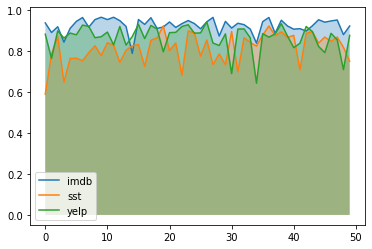

In [ ]:
comparison_plots(imdb_train_samples_10)

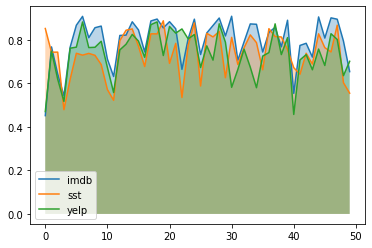

In [ ]:
comparison_plots(sst_train_samples_10)

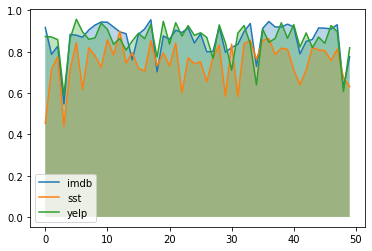

In [ ]:
comparison_plots(yelp_train_samples_10)

In [ ]:
def histogram_plots(train_samples, metric, id_data):
    similarity_1 = []
    similarity_2 = []
    similarity_3 = []

    if metric == 'cosine':
        for i,j,k,l,m,n,o in zip(train_samples, imdb_test_samples_10, sst_test_samples_10, yelp_test_samples_10, imdb_test_samples_20, sst_test_samples_20, yelp_test_samples_20):
            s_1 = nlp(i).similarity(nlp(j))
            s_2 = nlp(i).similarity(nlp(k))
            s_3 = nlp(i).similarity(nlp(l))
            s_4 = nlp(i).similarity(nlp(m))
            s_5 = nlp(i).similarity(nlp(n))
            s_6 = nlp(i).similarity(nlp(o))

            similarity_1.append(mean([s_1, s_4]))
            similarity_2.append(mean([s_2, s_5]))
            similarity_3.append(mean([s_3, s_6]))

    elif metric == 'mauve':
        for i,j,k,l,m,n,o in zip(train_samples, imdb_test_samples_10, sst_test_samples_10, yelp_test_samples_10, imdb_test_samples_20, sst_test_samples_20, yelp_test_samples_20):
            s_1 = mauve.compute_mauve(p_text=i, q_text=j, device_id=0, max_text_length=256, verbose=False)
            s_2 = mauve.compute_mauve(p_text=i, q_text=k, device_id=0, max_text_length=256, verbose=False)
            s_3 = mauve.compute_mauve(p_text=i, q_text=l, device_id=0, max_text_length=256, verbose=False)
            s_4 = mauve.compute_mauve(p_text=i, q_text=m, device_id=0, max_text_length=256, verbose=False)
            s_5 = mauve.compute_mauve(p_text=i, q_text=n, device_id=0, max_text_length=256, verbose=False)
            s_6 = mauve.compute_mauve(p_text=i, q_text=o, device_id=0, max_text_length=256, verbose=False)

            similarity_1.append(mean([s_1, s_4]))
            similarity_2.append(mean([s_2, s_5]))
            similarity_3.append(mean([s_3, s_6]))

    elif metric == 'wmd':
        for i,j,k,l,m,n,o in zip(train_samples, imdb_test_samples_10, sst_test_samples_10, yelp_test_samples_10, imdb_test_samples_20, sst_test_samples_20, yelp_test_samples_20):
            s_1 = model.wv.wmdistance(preprocess(i), preprocess(j))
            s_2 = model.wv.wmdistance(preprocess(i), preprocess(k))
            s_3 = model.wv.wmdistance(preprocess(i), preprocess(l))
            s_4 = model.wv.wmdistance(preprocess(i), preprocess(m))
            s_5 = model.wv.wmdistance(preprocess(i), preprocess(n))
            s_6 = model.wv.wmdistance(preprocess(i), preprocess(o))

            similarity_1.append(mean([s_1, s_4]))
            similarity_2.append(mean([s_2, s_5]))
            similarity_3.append(mean([s_3, s_6]))
        
    elif metric == 'jsd':
        for i,j,k,l,m,n,o in zip(train_samples, imdb_test_samples_10, sst_test_samples_10, yelp_test_samples_10, imdb_test_samples_20, sst_test_samples_20, yelp_test_samples_20):
            s_1 = distance.jensenshannon(softmax(nlp(i).vector), softmax(nlp(j).vector))
            s_2 = distance.jensenshannon(softmax(nlp(i).vector), softmax(nlp(k).vector))
            s_3 = distance.jensenshannon(softmax(nlp(i).vector), softmax(nlp(l).vector))
            s_4 = distance.jensenshannon(softmax(nlp(i).vector), softmax(nlp(m).vector))
            s_5 = distance.jensenshannon(softmax(nlp(i).vector), softmax(nlp(n).vector))
            s_6 = distance.jensenshannon(softmax(nlp(i).vector), softmax(nlp(o).vector))

            similarity_1.append(mean([s_1, s_4]))
            similarity_2.append(mean([s_2, s_5]))
            similarity_3.append(mean([s_3, s_6]))

    elif metric == 'wasserstein':
        for i,j,k,l,m,n,o in zip(train_samples, imdb_test_samples_10, sst_test_samples_10, yelp_test_samples_10, imdb_test_samples_20, sst_test_samples_20, yelp_test_samples_20):
            s_1 = wasserstein_distance([embed([i])], [embed([j])])
            s_2 = wasserstein_distance([embed([i])], [embed([k])])
            s_3 = wasserstein_distance([embed([i])], [embed([l])])
            s_4 = wasserstein_distance([embed([i])], [embed([m])])
            s_5 = wasserstein_distance([embed([i])], [embed([n])])
            s_6 = wasserstein_distance([embed([i])], [embed([o])])

            similarity_1.append(mean([s_1, s_4]))
            similarity_2.append(mean([s_2, s_5]))
            similarity_3.append(mean([s_3, s_6]))


    x = list(range(num_of_samples))

    plt.rcParams.update({'font.size': 16})
    plt.hist(similarity_1, alpha=0.60, label=id_data+" vs imdb")
    plt.hist(similarity_2, alpha=0.60, label=id_data+" vs sst")
    plt.hist(similarity_3, alpha=0.60, label=id_data+" vs yelp")
    # plt.bar(x, similarity_1, label="imdb", width=1.0, alpha=0.60)
    # plt.fill_between(x, similarity_1, alpha=0.30)
    # plt.bar(x, similarity_2, label="sst", width=1.0, alpha=0.60)
    # plt.fill_between(x, similarity_2, alpha=0.30)
    # plt.bar(x, similarity_3, label="yelp", width=1.0, alpha=0.60)
    # plt.fill_between(x, similarity_3, alpha=0.30)
    plt.legend()

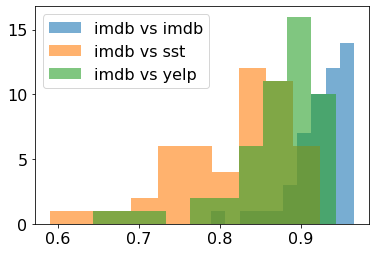

In [ ]:
histogram_plots(imdb_train_samples_10, 'cosine', 'imdb')

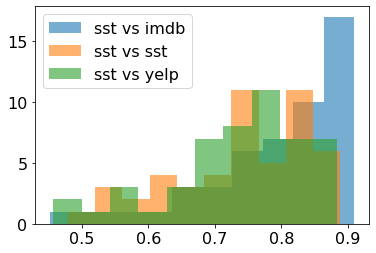

In [ ]:
histogram_plots(sst_train_samples_10, 'cosine', 'sst')

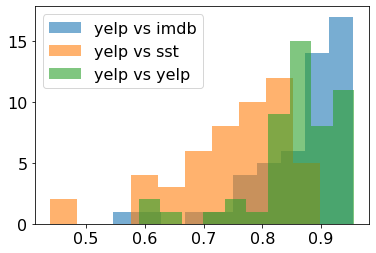

In [ ]:
histogram_plots(yelp_train_samples_10, 'cosine', 'yelp')

### Data prep

In [ ]:
# # imdb_train_samples_10 = imdb_dataset['train'].shuffle(seed=40).select(range(20))['text']
# # imdb_test_samples_10 = imdb_dataset['test'].shuffle(seed=40).select(range(20))['text']

# # sst_train_samples_10 = sst_dataset['train'].shuffle(seed=40).select(range(20))['text']
# # sst_test_samples_10 = sst_dataset['test'].shuffle(seed=40).select(range(20))['text']

# # yelp_train_samples_10 = yelp_dataset['train'].shuffle(seed=40).select(range(20))['text']
# # yelp_test_samples_10 = yelp_dataset['test'].shuffle(seed=40).select(range(20))['text']

# imdb_train_samples_10 = imdb_dataset['train'].shuffle(seed=40).select(range(909))['text']
# imdb_test_samples_10 = imdb_dataset['test'].shuffle(seed=40).select(range(909))['text']

# sst_train_samples_10 = sst_dataset['train'].shuffle(seed=40).select(range(909))['text']
# sst_test_samples_10 = sst_dataset['test'].shuffle(seed=40).select(range(909))['text']

# yelp_train_samples_10 = yelp_dataset['train'].shuffle(seed=40).select(range(909))['text']
# yelp_test_samples_10 = yelp_dataset['test'].shuffle(seed=40).select(range(909))['text']


# imdb_train_samples_10 = [remove_html_tags(item) for item in imdb_train_samples_10]
# imdb_test_samples_10 = [remove_html_tags(item) for item in imdb_test_samples_10]
# sst_train_samples_10 = [remove_html_tags(item) for item in sst_train_samples_10]
# sst_test_samples_10 = [remove_html_tags(item) for item in sst_test_samples_10]
# yelp_train_samples_10 = [remove_html_tags(item) for item in yelp_train_samples_10]
# yelp_test_samples_10 = [remove_html_tags(item) for item in yelp_test_samples_10]

### Metrics

In [22]:
!pip install -q sentence_transformers

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.0/86.0 KB 3.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 4.2 MB/s eta 0:00:00


In [ ]:
from sentence_transformers import SentenceTransformer

st_model = SentenceTransformer('sentence-transformers/sentence-t5-base')

In [ ]:
cosine_st(imdb_train_samples_10, imdb_test_samples_10, "imdb_vs_imdb", st_model)
cosine_st(imdb_train_samples_10, sst_test_samples_10, "imdb_vs_sst", st_model)
cosine_st(imdb_train_samples_10, yelp_test_samples_10, "imdb_vs_yelp", st_model)
cosine_st(sst_train_samples_10, sst_test_samples_10, "sst_vs_sst", st_model)
cosine_st(sst_train_samples_10, imdb_test_samples_10, "sst_vs_imdb", st_model)
cosine_st(sst_train_samples_10, yelp_test_samples_10, "sst_vs_yelp", st_model)
cosine_st(yelp_train_samples_10, yelp_test_samples_10, "yelp_vs_yelp", st_model)
cosine_st(yelp_train_samples_10, imdb_test_samples_10, "yelp_vs_imdb", st_model)
cosine_st(yelp_train_samples_10, sst_test_samples_10, "yelp_vs_sst", st_model)

Avg: 0.8447469
Avg: 0.74856615
Avg: 0.7747492
Avg: 0.73349637
Avg: 0.7506648
Avg: 0.70301235
Avg: 0.8164883
Avg: 0.7637332
Avg: 0.704663


In [ ]:
cosine(imdb_train_samples_100, imdb_test_samples_100, "imdb_vs_imdb")
cosine(imdb_train_samples_100, sst_test_samples_100, "imdb_vs_sst")
cosine(imdb_train_samples_100, yelp_test_samples_100, "imdb_vs_yelp")
cosine(sst_train_samples_100, sst_test_samples_100, "sst_vs_sst")
cosine(sst_train_samples_100, imdb_test_samples_100, "sst_vs_imdb")
cosine(sst_train_samples_100, yelp_test_samples_100, "sst_vs_yelp")
cosine(yelp_train_samples_100, yelp_test_samples_100, "yelp_vs_yelp")
cosine(yelp_train_samples_100, imdb_test_samples_100, "yelp_vs_imdb")
cosine(yelp_train_samples_100, sst_test_samples_100, "yelp_vs_sst")

Avg: 0.9222448083829008
Avg: 0.8048561553125358
Avg: 0.8741972671173632
Avg: 0.7144887316370749
Avg: 0.7919225952218014
Avg: 0.7420760714378352
Avg: 0.8797640994927424
Avg: 0.8764758190328943
Avg: 0.7479123637146602


In [24]:
cosine_st(imdb_train_samples_100, imdb_test_samples_100, "imdb_vs_imdb", st_model)
cosine_st(imdb_train_samples_100, sst_test_samples_100, "imdb_vs_sst", st_model)
cosine_st(imdb_train_samples_100, yelp_test_samples_100, "imdb_vs_yelp", st_model)
cosine_st(sst_train_samples_100, sst_test_samples_100, "sst_vs_sst", st_model)
cosine_st(sst_train_samples_100, imdb_test_samples_100, "sst_vs_imdb", st_model)
cosine_st(sst_train_samples_100, yelp_test_samples_100, "sst_vs_yelp", st_model)
cosine_st(yelp_train_samples_100, yelp_test_samples_100, "yelp_vs_yelp", st_model)
cosine_st(yelp_train_samples_100, imdb_test_samples_100, "yelp_vs_imdb", st_model)
cosine_st(yelp_train_samples_100, sst_test_samples_100, "yelp_vs_sst", st_model)

Avg: 0.84398675
Avg: 0.7504408
Avg: 0.76238185
Avg: 0.7298584
Avg: 0.75003976
Avg: 0.6968716
Avg: 0.8032997
Avg: 0.76052594
Avg: 0.70050776


In [ ]:
mauve_score_st(imdb_train_samples_10, imdb_test_samples_10, "imdb_vs_imdb", st_model)
mauve_score_st(imdb_train_samples_10, sst_test_samples_10, "imdb_vs_sst", st_model)
mauve_score_st(imdb_train_samples_10, yelp_test_samples_10, "imdb_vs_yelp", st_model)
mauve_score_st(sst_train_samples_10, sst_test_samples_10, "sst_vs_sst", st_model)
mauve_score_st(sst_train_samples_10, imdb_test_samples_10, "sst_vs_imdb", st_model)
mauve_score_st(sst_train_samples_10, yelp_test_samples_10, "sst_vs_yelp", st_model)
mauve_score_st(yelp_train_samples_10, yelp_test_samples_10, "yelp_vs_yelp", st_model)
mauve_score_st(yelp_train_samples_10, imdb_test_samples_10, "yelp_vs_imdb", st_model)
mauve_score_st(yelp_train_samples_10, sst_test_samples_10, "yelp_vs_sst", st_model)

0.9918369771923911
0.032044394608625515
0.0040720962619612555
0.9983544482169308
0.0040720962619612555
0.0040720962619612555
0.9921547665648818
0.0040720962619612555
0.010524716425594154


In [ ]:
wasswestein_distance_st(imdb_train_samples_10, imdb_test_samples_10, "imdb_vs_imdb", st_model)
wasswestein_distance_st(imdb_train_samples_10, sst_test_samples_10, "imdb_vs_sst", st_model)
wasswestein_distance_st(imdb_train_samples_10, yelp_test_samples_10, "imdb_vs_yelp", st_model)
wasswestein_distance_st(sst_train_samples_10, sst_test_samples_10, "sst_vs_sst", st_model)
wasswestein_distance_st(sst_train_samples_10, imdb_test_samples_10, "sst_vs_imdb", st_model)
wasswestein_distance_st(sst_train_samples_10, yelp_test_samples_10, "sst_vs_yelp", st_model)
wasswestein_distance_st(yelp_train_samples_10, yelp_test_samples_10, "yelp_vs_yelp", st_model)
wasswestein_distance_st(yelp_train_samples_10, imdb_test_samples_10, "yelp_vs_imdb", st_model)
wasswestein_distance_st(yelp_train_samples_10, sst_test_samples_10, "yelp_vs_sst", st_model)

Avg: 0.0014119994314558512
Avg: 0.0015834490267335375
Avg: 0.0015818754326726815
Avg: 0.0016065389382197686
Avg: 0.0014754291942575511
Avg: 0.0016024237481357337
Avg: 0.0013959516280815476
Avg: 0.001640554401897616
Avg: 0.0016494552030556608


In [ ]:
jsd_st(imdb_train_samples_10, imdb_test_samples_10, "imdb_vs_imdb", st_model)
jsd_st(imdb_train_samples_10, sst_test_samples_10, "imdb_vs_sst", st_model)
jsd_st(imdb_train_samples_10, yelp_test_samples_10, "imdb_vs_yelp", st_model)
jsd_st(sst_train_samples_10, sst_test_samples_10, "sst_vs_sst", st_model)
jsd_st(sst_train_samples_10, imdb_test_samples_10, "sst_vs_imdb", st_model)
jsd_st(sst_train_samples_10, yelp_test_samples_10, "sst_vs_yelp", st_model)
jsd_st(yelp_train_samples_10, yelp_test_samples_10, "yelp_vs_yelp", st_model)
jsd_st(yelp_train_samples_10, imdb_test_samples_10, "yelp_vs_imdb", st_model)
jsd_st(yelp_train_samples_10, sst_test_samples_10, "yelp_vs_sst", st_model)

Avg: 0.007077193982137073
Avg: 0.00902271369757494
Avg: 0.008528849726714666
Avg: 0.009285736325854593
Avg: 0.008988391818128674
Avg: 0.009819657442388045
Avg: 0.007622333679127964
Avg: 0.008732417020200474
Avg: 0.009787711535270244


In [ ]:
cosine_1x1(imdb_train_samples_10, imdb_test_samples_10, "imdb_vs_imdb")
cosine_1x1(imdb_train_samples_10, sst_test_samples_10, "imdb_vs_sst")
cosine_1x1(imdb_train_samples_10, yelp_test_samples_10, "imdb_vs_yelp")
cosine_1x1(sst_train_samples_10, sst_test_samples_10, "sst_vs_sst")
cosine_1x1(sst_train_samples_10, imdb_test_samples_10, "sst_vs_imdb")
cosine_1x1(sst_train_samples_10, yelp_test_samples_10, "sst_vs_yelp")
cosine_1x1(yelp_train_samples_10, yelp_test_samples_10, "yelp_vs_yelp")
cosine_1x1(yelp_train_samples_10, imdb_test_samples_10, "yelp_vs_imdb")
cosine_1x1(yelp_train_samples_10, sst_test_samples_10, "yelp_vs_sst")

In [ ]:
wmd(imdb_train_samples_10, imdb_test_samples_10, "imdb_vs_imdb")
wmd(imdb_train_samples_10, sst_test_samples_10, "imdb_vs_sst")
wmd(imdb_train_samples_10, yelp_test_samples_10, "imdb_vs_yelp")
wmd(sst_train_samples_10, sst_test_samples_10, "sst_vs_sst")
wmd(sst_train_samples_10, imdb_test_samples_10, "sst_vs_imdb")
wmd(sst_train_samples_10, yelp_test_samples_10, "sst_vs_yelp")
wmd(yelp_train_samples_10, yelp_test_samples_10, "yelp_vs_yelp")
wmd(yelp_train_samples_10, imdb_test_samples_10, "yelp_vs_imdb")
wmd(yelp_train_samples_10, sst_test_samples_10, "yelp_vs_sst")

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:26: DeprecationWarning: Call to deprecated `wv` (Attribute will be removed in 4.0.0, use self instead).


Avg: 2.052843796050597
Avg: 2.6316607985171645
Avg: 2.266786492684808
Avg: 2.8378039220959534
Avg: 2.638886519800716
Avg: 2.7412222390706336
Avg: 2.2853204277884642
Avg: 2.2394081704907394
Avg: 2.698941804222411


In [ ]:
wasswestein_distance(imdb_train_samples_10, imdb_test_samples_10, "imdb_vs_imdb")
wasswestein_distance(imdb_train_samples_10, sst_test_samples_10, "imdb_vs_sst")
wasswestein_distance(imdb_train_samples_10, yelp_test_samples_10, "imdb_vs_yelp")
wasswestein_distance(sst_train_samples_10, sst_test_samples_10, "sst_vs_sst")
wasswestein_distance(sst_train_samples_10, imdb_test_samples_10, "sst_vs_imdb")
wasswestein_distance(sst_train_samples_10, yelp_test_samples_10, "sst_vs_yelp")
wasswestein_distance(yelp_train_samples_10, yelp_test_samples_10, "yelp_vs_yelp")
wasswestein_distance(yelp_train_samples_10, imdb_test_samples_10, "yelp_vs_imdb")
wasswestein_distance(yelp_train_samples_10, sst_test_samples_10, "yelp_vs_sst")

Avg: 0.004063422068930782
Avg: 0.005213121765422568
Avg: 0.003945593225180164
Avg: 0.003225555292330311
Avg: 0.005167079106564725
Avg: 0.004613801928575465
Avg: 0.003653520422484031
Avg: 0.004138279688917881
Avg: 0.0038607499502831865


In [ ]:
jsd(imdb_train_samples_10, imdb_test_samples_10, "imdb_vs_imdb")
jsd(imdb_train_samples_10, sst_test_samples_10, "imdb_vs_sst")
jsd(imdb_train_samples_10, yelp_test_samples_10, "imdb_vs_yelp")
jsd(sst_train_samples_10, sst_test_samples_10, "sst_vs_sst")
jsd(sst_train_samples_10, imdb_test_samples_10, "sst_vs_imdb")
jsd(sst_train_samples_10, yelp_test_samples_10, "sst_vs_yelp")
jsd(yelp_train_samples_10, yelp_test_samples_10, "yelp_vs_yelp")
jsd(yelp_train_samples_10, imdb_test_samples_10, "yelp_vs_imdb")
jsd(yelp_train_samples_10, sst_test_samples_10, "yelp_vs_sst")

Avg: 0.21416054828811534
Avg: 0.36627901364387533
Avg: 0.26392764432282045
Avg: 0.4670061471927802
Avg: 0.38856273909019434
Avg: 0.4176951629883848
Avg: 0.26888886653264504
Avg: 0.27098500801449205
Avg: 0.4011094626246109


In [ ]:
# mauve_score(imdb_train_samples_10, imdb_test_samples_10, "imdb_vs_imdb")
# mauve_score(imdb_train_samples_10, sst_test_samples_10, "imdb_vs_sst")
mauve_score(imdb_train_samples_10, yelp_test_samples_10, "imdb_vs_yelp")
mauve_score(sst_train_samples_10, sst_test_samples_10, "sst_vs_sst")
mauve_score(sst_train_samples_10, imdb_test_samples_10, "sst_vs_imdb")
mauve_score(sst_train_samples_10, yelp_test_samples_10, "sst_vs_yelp")
mauve_score(yelp_train_samples_10, yelp_test_samples_10, "yelp_vs_yelp")
mauve_score(yelp_train_samples_10, sst_test_samples_10, "yelp_vs_sst")
mauve_score(yelp_train_samples_10, imdb_test_samples_10, "yelp_vs_imdb")

#MCQ Task

In [ ]:
# SCIQ
sciq_dataset = load_dataset("sciq")
sciq_dataset

In [ ]:
commonsense_dataset = load_dataset("commonsense_qa")
commonsense_dataset

In [ ]:
qasc_dataset = load_dataset("qasc")
qasc_dataset

In [ ]:
df_sciq_train = pd.DataFrame(sciq_dataset['train'])
df_cs_train = pd.DataFrame(commonsense_dataset['train'])
df_qasc_train = pd.DataFrame(qasc_dataset['train'])

df_sciq_test = pd.DataFrame(sciq_dataset['test'])
df_cs_test = pd.DataFrame(commonsense_dataset['test'])
df_qasc_test = pd.DataFrame(qasc_dataset['validation'])

df_sciq_train["question"] = df_sciq_train["support"] + df_sciq_train["question"]
# df_cs_train["question"] = df_cs_train["context"] + df_cs_train["question"]
df_qasc_train["question"] = df_qasc_train["fact1"] + df_qasc_train["fact2"] + df_qasc_train["combinedfact"] + df_qasc_train["question"]

df_sciq_test["question"] = df_sciq_test["support"] + df_sciq_test["question"]
# df_cs_test["question"] = df_cs_test["context"] + df_cs_test["question"]
df_qasc_test["question"] = df_qasc_test["fact1"] + df_qasc_test["fact2"] + df_qasc_test["combinedfact"] + df_qasc_test["question"]

# convert to Dataset type
sciq_dataset = datasets.DatasetDict(
    {"train": Dataset.from_pandas(df_sciq_train),
    "test": Dataset.from_pandas(df_sciq_test)
    })

commonsense_dataset = datasets.DatasetDict(
    {"train": Dataset.from_pandas(df_cs_train),
    "test": Dataset.from_pandas(df_cs_test)
    })

qasc_dataset = datasets.DatasetDict(
    {"train": Dataset.from_pandas(df_qasc_train),
    "test": Dataset.from_pandas(df_qasc_test)
    })

In [ ]:
sciq_train_samples_10 = sciq_dataset['train'].shuffle(seed=40).select(range(20))['question']
sciq_test_samples_10 = sciq_dataset['test'].shuffle(seed=40).select(range(20))['question']

commonsense_train_samples_10 = commonsense_dataset['train'].shuffle(seed=40).select(range(20))['question']
commonsense_test_samples_10 = commonsense_dataset['test'].shuffle(seed=40).select(range(20))['question']

qasc_train_samples_10 = qasc_dataset['train'].shuffle(seed=40).select(range(20))['question']
qasc_test_samples_10 = qasc_dataset['test'].shuffle(seed=40).select(range(20))['question']

## Metrics

In [ ]:
cosine_1x1(sciq_train_samples_10, sciq_test_samples_10, "sciq_vs_sciq")
cosine_1x1(sciq_train_samples_10, commonsense_test_samples_10, "sciq_vs_cs")
cosine_1x1(sciq_train_samples_10, qasc_test_samples_10, "sciq_vs_qasc")
cosine_1x1(commonsense_train_samples_10, commonsense_test_samples_10, "cs_vs_cs")
cosine_1x1(commonsense_train_samples_10, sciq_test_samples_10, "cs_vs_sciq")
cosine_1x1(commonsense_train_samples_10, qasc_test_samples_10, "cs_vs_qasc")
cosine_1x1(qasc_train_samples_10, qasc_test_samples_10, "qasc_vs_qasc")
cosine_1x1(qasc_train_samples_10, sciq_test_samples_10, "qasc_vs_sciq")
cosine_1x1(qasc_train_samples_10, commonsense_test_samples_10, "qasc_vs_cs")

Avg: 0.8275065106836804
Avg: 0.6659068314592502
Avg: 0.7808105575279711
Avg: 0.7189519773340651
Avg: 0.6236424185363407
Avg: 0.6159738756232797
Avg: 0.7557307561170571
Avg: 0.7889270642476692
Avg: 0.6647241324918725


In [ ]:
cosine_bert(sciq_train_samples_10, sciq_test_samples_10, "sciq_vs_sciq", st_model)
cosine_bert(sciq_train_samples_10, commonsense_test_samples_10, "sciq_vs_cs", st_model)
cosine_bert(sciq_train_samples_10, qasc_test_samples_10, "sciq_vs_qasc", st_model)
cosine_bert(commonsense_train_samples_10, commonsense_test_samples_10, "cs_vs_cs", st_model)
cosine_bert(commonsense_train_samples_10, sciq_test_samples_10, "cs_vs_sciq", st_model)
cosine_bert(commonsense_train_samples_10, qasc_test_samples_10, "cs_vs_qasc", st_model)
cosine_bert(qasc_train_samples_10, qasc_test_samples_10, "qasc_vs_qasc", st_model)
cosine_bert(qasc_train_samples_10, sciq_test_samples_10, "qasc_vs_sciq", st_model)
cosine_bert(qasc_train_samples_10, commonsense_test_samples_10, "qasc_vs_cs", st_model)

Avg: 0.76713
Avg: 0.7146117
Avg: 0.7500312
Avg: 0.7284989
Avg: 0.71022683
Avg: 0.7198223
Avg: 0.749997
Avg: 0.75458026
Avg: 0.7155227


In [ ]:
wmd(sciq_train_samples_10, sciq_test_samples_10, "sciq_vs_sciq")
wmd(sciq_train_samples_10, commonsense_test_samples_10, "sciq_vs_cs")
wmd(sciq_train_samples_10, qasc_test_samples_10, "sciq_vs_qasc")
wmd(commonsense_train_samples_10, commonsense_test_samples_10, "cs_vs_cs")
wmd(commonsense_train_samples_10, sciq_test_samples_10, "cs_vs_sciq")
wmd(commonsense_train_samples_10, qasc_test_samples_10, "cs_vs_qasc")
wmd(qasc_train_samples_10, qasc_test_samples_10, "qasc_vs_qasc")
wmd(qasc_train_samples_10, sciq_test_samples_10, "qasc_vs_sciq")
wmd(qasc_train_samples_10, commonsense_test_samples_10, "qasc_vs_cs")

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:26: DeprecationWarning: Call to deprecated `wv` (Attribute will be removed in 4.0.0, use self instead).


Avg: 2.7094529757598926
Avg: 2.7045344528118784
Avg: 2.8065485303716518
Avg: 2.453972809592745
Avg: 2.79128925856482
Avg: 2.787526229491444
Avg: 2.965503626119139
Avg: 2.949551284170462
Avg: 2.885660846954771


In [ ]:
wasswestein_distance(sciq_train_samples_10, sciq_test_samples_10, "sciq_vs_sciq")
wasswestein_distance(sciq_train_samples_10, commonsense_test_samples_10, "sciq_vs_cs")
wasswestein_distance(sciq_train_samples_10, qasc_test_samples_10, "sciq_vs_qasc")
wasswestein_distance(commonsense_train_samples_10, commonsense_test_samples_10, "cs_vs_cs")
wasswestein_distance(commonsense_train_samples_10, sciq_test_samples_10, "cs_vs_sciq")
wasswestein_distance(commonsense_train_samples_10, qasc_test_samples_10, "cs_vs_qasc")
wasswestein_distance(qasc_train_samples_10, qasc_test_samples_10, "qasc_vs_qasc")
wasswestein_distance(qasc_train_samples_10, sciq_test_samples_10, "qasc_vs_sciq")
wasswestein_distance(qasc_train_samples_10, commonsense_test_samples_10, "qasc_vs_cs")

Avg: 0.004247465656889287
Avg: 0.008741324425130736
Avg: 0.004533597853009997
Avg: 0.003526819242674599
Avg: 0.007478249840626512
Avg: 0.0051838879823347265
Avg: 0.0033274613945893676
Avg: 0.004302926408835455
Avg: 0.006853908354290695


In [ ]:
wasswestein_distance_st(sciq_train_samples_10, sciq_test_samples_10, "sciq_vs_sciq", st_model)
wasswestein_distance_st(sciq_train_samples_10, commonsense_test_samples_10, "sciq_vs_cs", st_model)
wasswestein_distance_st(sciq_train_samples_10, qasc_test_samples_10, "sciq_vs_qasc", st_model)
wasswestein_distance_st(commonsense_train_samples_10, commonsense_test_samples_10, "cs_vs_cs", st_model)
wasswestein_distance_st(commonsense_train_samples_10, sciq_test_samples_10, "cs_vs_sciq", st_model)
wasswestein_distance_st(commonsense_train_samples_10, qasc_test_samples_10, "cs_vs_qasc", st_model)
wasswestein_distance_st(qasc_train_samples_10, qasc_test_samples_10, "qasc_vs_qasc", st_model)
wasswestein_distance_st(qasc_train_samples_10, sciq_test_samples_10, "qasc_vs_sciq", st_model)
wasswestein_distance_st(qasc_train_samples_10, commonsense_test_samples_10, "qasc_vs_cs", st_model)

Avg: 0.0015819261998405107
Avg: 0.0016179654774559
Avg: 0.001621351558368005
Avg: 0.0014751623774192197
Avg: 0.001631245388231526
Avg: 0.001616558713503591
Avg: 0.0016561880418962183
Avg: 0.0016422864812403485
Avg: 0.0016418641850286949


In [ ]:
jsd(sciq_train_samples_10, sciq_test_samples_10, "sciq_vs_sciq")
jsd(sciq_train_samples_10, commonsense_test_samples_10, "sciq_vs_cs")
jsd(sciq_train_samples_10, qasc_test_samples_10, "sciq_vs_qasc")
jsd(commonsense_train_samples_10, commonsense_test_samples_10, "cs_vs_cs")
jsd(commonsense_train_samples_10, sciq_test_samples_10, "cs_vs_sciq")
jsd(commonsense_train_samples_10, qasc_test_samples_10, "cs_vs_qasc")
jsd(qasc_train_samples_10, qasc_test_samples_10, "qasc_vs_qasc")
jsd(qasc_train_samples_10, sciq_test_samples_10, "qasc_vs_sciq")
jsd(qasc_train_samples_10, commonsense_test_samples_10, "qasc_vs_cs")

Avg: 0.3370567953764705
Avg: 0.4634899044775298
Avg: 0.37366194502931405
Avg: 0.45236777896262853
Avg: 0.4840667638708095
Avg: 0.49251641497307724
Avg: 0.40600457229399656
Avg: 0.38454237651080514
Avg: 0.48549754323045136


In [ ]:
jsd_st(sciq_train_samples_10, sciq_test_samples_10, "sciq_vs_sciq", st_model)
jsd_st(sciq_train_samples_10, commonsense_test_samples_10, "sciq_vs_cs", st_model)
jsd_st(sciq_train_samples_10, qasc_test_samples_10, "sciq_vs_qasc", st_model)
jsd_st(commonsense_train_samples_10, commonsense_test_samples_10, "cs_vs_cs", st_model)
jsd_st(commonsense_train_samples_10, sciq_test_samples_10, "cs_vs_sciq", st_model)
jsd_st(commonsense_train_samples_10, qasc_test_samples_10, "cs_vs_qasc", st_model)
jsd_st(qasc_train_samples_10, qasc_test_samples_10, "qasc_vs_qasc", st_model)
jsd_st(qasc_train_samples_10, sciq_test_samples_10, "qasc_vs_sciq", st_model)
jsd_st(qasc_train_samples_10, commonsense_test_samples_10, "qasc_vs_cs", st_model)

Avg: 0.008670735432037514
Avg: 0.009619644289664163
Avg: 0.00899506492822262
Avg: 0.00936880924933416
Avg: 0.0096896077833668
Avg: 0.00952632717995875
Avg: 0.008993785317623276
Avg: 0.00890934098675684
Avg: 0.009598220772448937


In [ ]:
mauve_score(sciq_train_samples_10, sciq_test_samples_10, "sciq_vs_sciq")
mauve_score(sciq_train_samples_10, commonsense_test_samples_10, "sciq_vs_cs")
mauve_score(sciq_train_samples_10, qasc_test_samples_10, "sciq_vs_qasc")
mauve_score(commonsense_train_samples_10, commonsense_test_samples_10, "cs_vs_cs")
mauve_score(commonsense_train_samples_10, sciq_test_samples_10, "cs_vs_sciq")
mauve_score(commonsense_train_samples_10, qasc_test_samples_10, "cs_vs_qasc")
mauve_score(qasc_train_samples_10, qasc_test_samples_10, "qasc_vs_qasc")
mauve_score(qasc_train_samples_10, sciq_test_samples_10, "qasc_vs_sciq")
mauve_score(qasc_train_samples_10, commonsense_test_samples_10, "qasc_vs_cs")

In [ ]:
mauve_score_st(sciq_train_samples_10, sciq_test_samples_10, "sciq_vs_sciq", st_model)
mauve_score_st(sciq_train_samples_10, commonsense_test_samples_10, "sciq_vs_cs", st_model)
mauve_score_st(sciq_train_samples_10, qasc_test_samples_10, "sciq_vs_qasc", st_model)
mauve_score_st(commonsense_train_samples_10, commonsense_test_samples_10, "cs_vs_cs", st_model)
mauve_score_st(commonsense_train_samples_10, sciq_test_samples_10, "cs_vs_sciq", st_model)
mauve_score_st(commonsense_train_samples_10, qasc_test_samples_10, "cs_vs_qasc", st_model)
mauve_score_st(qasc_train_samples_10, qasc_test_samples_10, "qasc_vs_qasc", st_model)
mauve_score_st(qasc_train_samples_10, sciq_test_samples_10, "qasc_vs_sciq", st_model)
mauve_score_st(qasc_train_samples_10, commonsense_test_samples_10, "qasc_vs_cs", st_model)

1.0000000000000004
0.04893938891448334
0.7556831814051957
0.9921547665648818
0.04741657885433696
0.9594492892186854
0.9918369771923913
0.9983544482169308
0.15674445772462292


# Extractive QA Task

In [ ]:
path = "/Datasets/mrqa-dataset"

mrqa = load_from_disk(path)

In [ ]:
mrqa

DatasetDict({
    train: Dataset({
        features: ['subset', 'context', 'context_tokens', 'qid', 'question', 'question_tokens', 'detected_answers', 'answers'],
        num_rows: 516819
    })
    test: Dataset({
        features: ['subset', 'context', 'context_tokens', 'qid', 'question', 'question_tokens', 'detected_answers', 'answers'],
        num_rows: 9633
    })
    validation: Dataset({
        features: ['subset', 'context', 'context_tokens', 'qid', 'question', 'question_tokens', 'detected_answers', 'answers'],
        num_rows: 58221
    })
})

In [ ]:
df_squad_train = pd.DataFrame(mrqa['train'][:61688])
df_news_train = pd.DataFrame(mrqa['train'][86588:148276])
df_trivia_train = pd.DataFrame(mrqa['train'][160748:222436])

In [ ]:
df_squad_test = pd.DataFrame(mrqa['validation'][:4212])
df_news_test = pd.DataFrame(mrqa['validation'][10507:14719])
df_trivia_test = pd.DataFrame(mrqa['validation'][14719:18931])

In [ ]:
df_squad_train["question"] = df_squad_train["context"] + df_squad_train["question"]
df_news_train["question"] = df_news_train["context"] + df_news_train["question"]
df_trivia_train["question"] = df_trivia_train["context"] + df_trivia_train["question"]

df_squad_test["question"] = df_squad_test["context"] + df_squad_test["question"]
df_news_test["question"] = df_news_test["context"] + df_news_test["question"]
df_trivia_test["question"] = df_trivia_test["context"] + df_trivia_test["question"]

In [ ]:
# convert to Dataset type

squad = datasets.DatasetDict(
    {"train": Dataset.from_pandas(df_squad_train),
    "test": Dataset.from_pandas(df_squad_test)
    })

news = datasets.DatasetDict(
    {"train": Dataset.from_pandas(df_news_train),
    "test": Dataset.from_pandas(df_news_test)
    })

trivia = datasets.DatasetDict(
    {"train": Dataset.from_pandas(df_trivia_train),
    "test": Dataset.from_pandas(df_trivia_test)
    })

In [ ]:
squad_train_samples_10 = squad['train'].shuffle(seed=42).select(range(20))['question']
squad_test_samples_10 = squad['test'].shuffle(seed=42).select(range(20))['question']

news_train_samples_10 = news['train'].shuffle(seed=42).select(range(20))['question']
news_test_samples_10 = news['test'].shuffle(seed=42).select(range(20))['question']

trivia_train_samples_10 = trivia['train'].shuffle(seed=42).select(range(20))['question']
trivia_test_samples_10 = trivia['test'].shuffle(seed=42).select(range(20))['question']

##Metrics

In [ ]:
cosine_1x1(squad_train_samples_10, squad_test_samples_10, "squad_vs_squad")
cosine_1x1(squad_train_samples_10, news_test_samples_10, "squad_vs_news")
cosine_1x1(squad_train_samples_10, trivia_test_samples_10, "squad_vs_trivia")
cosine_1x1(news_train_samples_10, news_test_samples_10, "news_vs_news")
cosine_1x1(news_train_samples_10, squad_test_samples_10, "news_vs_squad")
cosine_1x1(news_train_samples_10, trivia_test_samples_10, "news_vs_trivia")
cosine_1x1(trivia_train_samples_10, trivia_test_samples_10, "trivia_vs_trivia")
cosine_1x1(trivia_train_samples_10, squad_test_samples_10, "trivia_vs_squad")
cosine_1x1(trivia_train_samples_10, news_test_samples_10, "trivia_vs_news")

Avg: 0.8496518308879555
Avg: 0.8217676586161495
Avg: 0.8188421176646976
Avg: 0.8938222218495594
Avg: 0.8643623421335072
Avg: 0.8458755029954836
Avg: 0.8846163961095356
Avg: 0.8257095903192397
Avg: 0.8202078926975731


In [ ]:
cosine_bert(squad_train_samples_10, squad_test_samples_10, "squad_vs_squad", st_model)
cosine_bert(squad_train_samples_10, news_test_samples_10, "squad_vs_news", st_model)
cosine_bert(squad_train_samples_10, trivia_test_samples_10, "squad_vs_trivia", st_model)
cosine_bert(news_train_samples_10, news_test_samples_10, "news_vs_news", st_model)
cosine_bert(news_train_samples_10, squad_test_samples_10, "news_vs_squad", st_model)
cosine_bert(news_train_samples_10, trivia_test_samples_10, "news_vs_trivia", st_model)
cosine_bert(trivia_train_samples_10, trivia_test_samples_10, "trivia_vs_trivia", st_model)
cosine_bert(trivia_train_samples_10, squad_test_samples_10, "trivia_vs_squad", st_model)
cosine_bert(trivia_train_samples_10, news_test_samples_10, "trivia_vs_news", st_model)

Avg: 0.7722458
Avg: 0.7849105
Avg: 0.7856761
Avg: 0.8163782
Avg: 0.7715785
Avg: 0.79602766
Avg: 0.8076391
Avg: 0.7820141
Avg: 0.80337566


In [ ]:
wmd(squad_train_samples_10, squad_test_samples_10, "squad_vs_squad")
wmd(squad_train_samples_10, news_test_samples_10, "squad_vs_news")
wmd(squad_train_samples_10, trivia_test_samples_10, "squad_vs_trivia")
wmd(news_train_samples_10, news_test_samples_10, "news_vs_news")
wmd(news_train_samples_10, squad_test_samples_10, "news_vs_squad")
wmd(news_train_samples_10, trivia_test_samples_10, "news_vs_trivia")
wmd(trivia_train_samples_10, trivia_test_samples_10, "trivia_vs_trivia")
wmd(trivia_train_samples_10, squad_test_samples_10, "trivia_vs_squad")
wmd(trivia_train_samples_10, news_test_samples_10, "trivia_vs_news")

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:26: DeprecationWarning: Call to deprecated `wv` (Attribute will be removed in 4.0.0, use self instead).


Avg: 2.491781133369459
Avg: 2.4140497328539996
Avg: 2.412842896983907
Avg: 2.159733454280407
Avg: 2.4608879408596276
Avg: 2.245518021930102
Avg: 2.201070099538054
Avg: 2.4447199924616796
Avg: 2.187646096281471


In [ ]:
wasswestein_distance(squad_train_samples_10, squad_test_samples_10, "squad_vs_squad")
wasswestein_distance(squad_train_samples_10, news_test_samples_10, "squad_vs_news")
wasswestein_distance(squad_train_samples_10, trivia_test_samples_10, "squad_vs_trivia")
wasswestein_distance(news_train_samples_10, news_test_samples_10, "news_vs_news")
wasswestein_distance(news_train_samples_10, squad_test_samples_10, "news_vs_squad")
wasswestein_distance(news_train_samples_10, trivia_test_samples_10, "news_vs_trivia")
wasswestein_distance(trivia_train_samples_10, trivia_test_samples_10, "trivia_vs_trivia")
wasswestein_distance(trivia_train_samples_10, squad_test_samples_10, "trivia_vs_squad")
wasswestein_distance(trivia_train_samples_10, news_test_samples_10, "trivia_vs_news")

Avg: 0.0037421224726598722
Avg: 0.004166949305878171
Avg: 0.005937073725137303
Avg: 0.003617746524085863
Avg: 0.004655113218040334
Avg: 0.003924990065095919
Avg: 0.0031711813652536103
Avg: 0.006208174988531936
Avg: 0.004261865807161422


In [ ]:
wasswestein_distance_st(squad_train_samples_10, squad_test_samples_10, "squad_vs_squad", st_model)
wasswestein_distance_st(squad_train_samples_10, news_test_samples_10, "squad_vs_news", st_model)
wasswestein_distance_st(squad_train_samples_10, trivia_test_samples_10, "squad_vs_trivia", st_model)
wasswestein_distance_st(news_train_samples_10, news_test_samples_10, "news_vs_news", st_model)
wasswestein_distance_st(news_train_samples_10, squad_test_samples_10, "news_vs_squad", st_model)
wasswestein_distance_st(news_train_samples_10, trivia_test_samples_10, "news_vs_trivia", st_model)
wasswestein_distance_st(trivia_train_samples_10, trivia_test_samples_10, "trivia_vs_trivia", st_model)
wasswestein_distance_st(trivia_train_samples_10, squad_test_samples_10, "trivia_vs_squad", st_model)
wasswestein_distance_st(trivia_train_samples_10, news_test_samples_10, "trivia_vs_news", st_model)

Avg: 0.001546577996357242
Avg: 0.001456627307637766
Avg: 0.0015170191584442806
Avg: 0.0014539952061492919
Avg: 0.0015566485620828504
Avg: 0.001524982486747213
Avg: 0.0015238905470160776
Avg: 0.001533141917735048
Avg: 0.0014903215272109767


In [ ]:
jsd(squad_train_samples_10, squad_test_samples_10, "squad_vs_squad")
jsd(squad_train_samples_10, news_test_samples_10, "squad_vs_news")
jsd(squad_train_samples_10, trivia_test_samples_10, "squad_vs_trivia")
jsd(news_train_samples_10, news_test_samples_10, "news_vs_news")
jsd(news_train_samples_10, squad_test_samples_10, "news_vs_squad")
jsd(news_train_samples_10, trivia_test_samples_10, "news_vs_trivia")
jsd(trivia_train_samples_10, trivia_test_samples_10, "trivia_vs_trivia")
jsd(trivia_train_samples_10, squad_test_samples_10, "trivia_vs_squad")
jsd(trivia_train_samples_10, news_test_samples_10, "trivia_vs_news")

Avg: 0.3396849141601763
Avg: 0.33392268229644395
Avg: 0.3352713973536902
Avg: 0.23652415507574334
Avg: 0.3162801627160571
Avg: 0.27131140048682645
Avg: 0.23863034820216664
Avg: 0.3459419703173773
Avg: 0.2903639961397763


In [ ]:
jsd_st(squad_train_samples_10, squad_test_samples_10, "squad_vs_squad", st_model)
jsd_st(squad_train_samples_10, news_test_samples_10, "squad_vs_news", st_model)
jsd_st(squad_train_samples_10, trivia_test_samples_10, "squad_vs_trivia", st_model)
jsd_st(news_train_samples_10, news_test_samples_10, "news_vs_news", st_model)
jsd_st(news_train_samples_10, squad_test_samples_10, "news_vs_squad", st_model)
jsd_st(news_train_samples_10, trivia_test_samples_10, "news_vs_trivia", st_model)
jsd_st(trivia_train_samples_10, trivia_test_samples_10, "trivia_vs_trivia", st_model)
jsd_st(trivia_train_samples_10, squad_test_samples_10, "trivia_vs_squad", st_model)
jsd_st(trivia_train_samples_10, news_test_samples_10, "trivia_vs_news", st_model)

Avg: 0.008580429579210515
Avg: 0.008346581610639229
Avg: 0.008331218821637674
Avg: 0.007696802446844294
Avg: 0.008602409393195036
Avg: 0.008132489567645385
Avg: 0.007895346010256913
Avg: 0.008404636912649229
Avg: 0.007981790954224906


In [ ]:
mauve_score(squad_train_samples_10, squad_test_samples_10, "squad_vs_squad")
mauve_score(squad_train_samples_10, news_test_samples_10, "squad_vs_news")
mauve_score(squad_train_samples_10, trivia_test_samples_10, "squad_vs_trivia")
mauve_score(news_train_samples_10, news_test_samples_10, "news_vs_news")
mauve_score(news_train_samples_10, squad_test_samples_10, "news_vs_squad")
mauve_score(news_train_samples_10, trivia_test_samples_10, "news_vs_trivia")
mauve_score(trivia_train_samples_10, trivia_test_samples_10, "trivia_vs_trivia")
mauve_score(trivia_train_samples_10, squad_test_samples_10, "trivia_vs_squad")
mauve_score(trivia_train_samples_10, news_test_samples_10, "trivia_vs_news")

In [ ]:
mauve_score_st(squad_train_samples_10, squad_test_samples_10, "squad_vs_squad", st_model)
mauve_score_st(squad_train_samples_10, news_test_samples_10, "squad_vs_news", st_model)
mauve_score_st(squad_train_samples_10, trivia_test_samples_10, "squad_vs_trivia", st_model)
mauve_score_st(news_train_samples_10, news_test_samples_10, "news_vs_news", st_model)
mauve_score_st(news_train_samples_10, squad_test_samples_10, "news_vs_squad", st_model)
mauve_score_st(news_train_samples_10, trivia_test_samples_10, "news_vs_trivia", st_model)
mauve_score_st(trivia_train_samples_10, trivia_test_samples_10, "trivia_vs_trivia", st_model)
mauve_score_st(trivia_train_samples_10, squad_test_samples_10, "trivia_vs_squad", st_model)
mauve_score_st(trivia_train_samples_10, news_test_samples_10, "trivia_vs_news", st_model)

0.9998655423221854
0.1737091517703269
0.8830952222817477
0.9749270571786395
0.04893938891448334
0.3486471923630428
0.9998958942037416
0.9871463766883635
0.1737091517703269


# NLI

In [ ]:
mnli_dataset = load_dataset("glue", "mnli")
wnli_dataset = load_dataset("glue", "wnli")
qnli_dataset = load_dataset("glue", "qnli")

In [ ]:
df_mnli_train = pd.DataFrame(mnli_dataset['train'])
df_wnli_train = pd.DataFrame(wnli_dataset['train'])
df_qnli_train = pd.DataFrame(qnli_dataset['train'])

df_mnli_test = pd.DataFrame(mnli_dataset['validation_mismatched'])
df_wnli_test = pd.DataFrame(wnli_dataset['validation'])
df_qnli_test = pd.DataFrame(qnli_dataset['validation'])

df_mnli_train["question"] = df_mnli_train["premise"] + df_mnli_train["hypothesis"]
df_wnli_train["question"] = df_wnli_train["sentence1"] + df_wnli_train["sentence2"]
df_qnli_train["question"] = df_qnli_train["question"] + df_qnli_train["sentence"]

df_mnli_test["question"] = df_mnli_test["premise"] + df_mnli_test["hypothesis"]
df_wnli_test["question"] = df_wnli_test["sentence1"] + df_wnli_test["sentence2"]
df_qnli_test["question"] = df_qnli_test["question"] + df_qnli_test["sentence"]

# convert to Dataset type
mnli_dataset = datasets.DatasetDict(
    {"train": Dataset.from_pandas(df_mnli_train),
    "test": Dataset.from_pandas(df_mnli_test)
    })

wnli_dataset = datasets.DatasetDict(
    {"train": Dataset.from_pandas(df_wnli_train),
    "test": Dataset.from_pandas(df_wnli_test)
    })

qnli_dataset = datasets.DatasetDict(
    {"train": Dataset.from_pandas(df_qnli_train),
    "test": Dataset.from_pandas(df_qnli_test)
    })

In [ ]:
mnli_train_samples_10 = mnli_dataset['train'].shuffle(seed=40).select(range(20))['question']
mnli_test_samples_10 = mnli_dataset['test'].shuffle(seed=40).select(range(20))['question']

wnli_train_samples_10 = wnli_dataset['train'].shuffle(seed=40).select(range(20))['question']
wnli_test_samples_10 = wnli_dataset['test'].shuffle(seed=40).select(range(20))['question']

qnli_train_samples_10 = qnli_dataset['train'].shuffle(seed=40).select(range(20))['question']
qnli_test_samples_10 = qnli_dataset['test'].shuffle(seed=40).select(range(20))['question']

## Metrics

In [ ]:
cosine_1x1(mnli_train_samples_10, mnli_test_samples_10, "mnli_vs_mnli")
cosine_1x1(mnli_train_samples_10, wnli_test_samples_10, "mnli_vs_wnli")
cosine_1x1(mnli_train_samples_10, qnli_test_samples_10, "mnli_vs_qnli")
cosine_1x1(wnli_train_samples_10, wnli_test_samples_10, "wnli_vs_wnli")
cosine_1x1(wnli_train_samples_10, mnli_test_samples_10, "wnli_vs_mnli")
cosine_1x1(wnli_train_samples_10, qnli_test_samples_10, "wnli_vs_qnli")
cosine_1x1(qnli_train_samples_10, qnli_test_samples_10, "qnli_vs_qnli")
cosine_1x1(qnli_train_samples_10, mnli_test_samples_10, "qnli_vs_mnli")
cosine_1x1(qnli_train_samples_10, wnli_test_samples_10, "qnli_vs_wnli")

Avg: 0.7262624733520991
Avg: 0.7133095212008355
Avg: 0.736830573104666
Avg: 0.7455293107367992
Avg: 0.6849892584517432
Avg: 0.6711388197735173
Avg: 0.7517095449617034
Avg: 0.6468534789561713
Avg: 0.5856770603173422


In [ ]:
cosine_bert(mnli_train_samples_10, mnli_test_samples_10, "mnli_vs_mnli", st_model)
cosine_bert(mnli_train_samples_10, wnli_test_samples_10, "mnli_vs_wnli", st_model)
cosine_bert(mnli_train_samples_10, qnli_test_samples_10, "mnli_vs_qnli", st_model)
cosine_bert(wnli_train_samples_10, wnli_test_samples_10, "wnli_vs_wnli", st_model)
cosine_bert(wnli_train_samples_10, mnli_test_samples_10, "wnli_vs_mnli", st_model)
cosine_bert(wnli_train_samples_10, qnli_test_samples_10, "wnli_vs_qnli", st_model)
cosine_bert(qnli_train_samples_10, qnli_test_samples_10, "qnli_vs_qnli", st_model)
cosine_bert(qnli_train_samples_10, mnli_test_samples_10, "qnli_vs_mnli", st_model)
cosine_bert(qnli_train_samples_10, wnli_test_samples_10, "qnli_vs_wnli", st_model)

Avg: 0.6974648
Avg: 0.6866287
Avg: 0.7062323
Avg: 0.70691574
Avg: 0.6938503
Avg: 0.70037365
Avg: 0.7249011
Avg: 0.6973696
Avg: 0.686919


In [ ]:
wmd(mnli_train_samples_10, mnli_test_samples_10, "mnli_vs_mnli")
wmd(mnli_train_samples_10, wnli_test_samples_10, "mnli_vs_wnli")
wmd(mnli_train_samples_10, qnli_test_samples_10, "mnli_vs_qnli")
wmd(wnli_train_samples_10, wnli_test_samples_10, "wnli_vs_wnli")
wmd(wnli_train_samples_10, mnli_test_samples_10, "wnli_vs_mnli")
wmd(wnli_train_samples_10, qnli_test_samples_10, "wnli_vs_qnli")
wmd(qnli_train_samples_10, qnli_test_samples_10, "qnli_vs_qnli")
wmd(qnli_train_samples_10, mnli_test_samples_10, "qnli_vs_mnli")
wmd(qnli_train_samples_10, wnli_test_samples_10, "qnli_vs_wnli")

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:26: DeprecationWarning: Call to deprecated `wv` (Attribute will be removed in 4.0.0, use self instead).


Avg: 2.590425063289064
Avg: 2.569171038192474
Avg: 2.6295188180205056
Avg: 2.4836591123243226
Avg: 2.609549107514817
Avg: 2.6601310756883016
Avg: 2.648023330309957
Avg: 2.659701849864154
Avg: 2.67459290042564


In [ ]:
wasswestein_distance(mnli_train_samples_10, mnli_test_samples_10, "mnli_vs_mnli")
wasswestein_distance(mnli_train_samples_10, wnli_test_samples_10, "mnli_vs_wnli")
wasswestein_distance(mnli_train_samples_10, qnli_test_samples_10, "mnli_vs_qnli")
wasswestein_distance(wnli_train_samples_10, wnli_test_samples_10, "wnli_vs_wnli")
wasswestein_distance(wnli_train_samples_10, mnli_test_samples_10, "wnli_vs_mnli")
wasswestein_distance(wnli_train_samples_10, qnli_test_samples_10, "wnli_vs_qnli")
wasswestein_distance(qnli_train_samples_10, qnli_test_samples_10, "qnli_vs_qnli")
wasswestein_distance(qnli_train_samples_10, mnli_test_samples_10, "qnli_vs_mnli")
wasswestein_distance(qnli_train_samples_10, wnli_test_samples_10, "qnli_vs_wnli")

Avg: 0.003554252621577254
Avg: 0.003263833979486609
Avg: 0.003762540877070702
Avg: 0.0032291035628628614
Avg: 0.003603906560946668
Avg: 0.003546059223102365
Avg: 0.0036902543377550275
Avg: 0.003909080717819031
Avg: 0.003489561383770708


In [ ]:
wasswestein_distance_st(mnli_train_samples_10, mnli_test_samples_10, "mnli_vs_mnli", st_model)
wasswestein_distance_st(mnli_train_samples_10, wnli_test_samples_10, "mnli_vs_wnli", st_model)
wasswestein_distance_st(mnli_train_samples_10, qnli_test_samples_10, "mnli_vs_qnli", st_model)
wasswestein_distance_st(wnli_train_samples_10, wnli_test_samples_10, "wnli_vs_wnli", st_model)
wasswestein_distance_st(wnli_train_samples_10, mnli_test_samples_10, "wnli_vs_mnli", st_model)
wasswestein_distance_st(wnli_train_samples_10, qnli_test_samples_10, "wnli_vs_qnli", st_model)
wasswestein_distance_st(qnli_train_samples_10, qnli_test_samples_10, "qnli_vs_qnli", st_model)
wasswestein_distance_st(qnli_train_samples_10, mnli_test_samples_10, "qnli_vs_mnli", st_model)
wasswestein_distance_st(qnli_train_samples_10, wnli_test_samples_10, "qnli_vs_wnli", st_model)

Avg: 0.0016253229099389309
Avg: 0.0016763206961475715
Avg: 0.0017308345806663007
Avg: 0.0015648694758442735
Avg: 0.001621431609210369
Avg: 0.0015891098842483425
Avg: 0.0016525118956697599
Avg: 0.0015680882936919846
Avg: 0.0016281136991242273


In [ ]:
jsd(mnli_train_samples_10, mnli_test_samples_10, "mnli_vs_mnli")
jsd(mnli_train_samples_10, wnli_test_samples_10, "mnli_vs_wnli")
jsd(mnli_train_samples_10, qnli_test_samples_10, "mnli_vs_qnli")
jsd(wnli_train_samples_10, wnli_test_samples_10, "wnli_vs_wnli")
jsd(wnli_train_samples_10, mnli_test_samples_10, "wnli_vs_mnli")
jsd(wnli_train_samples_10, qnli_test_samples_10, "wnli_vs_qnli")
jsd(qnli_train_samples_10, qnli_test_samples_10, "qnli_vs_qnli")
jsd(qnli_train_samples_10, mnli_test_samples_10, "qnli_vs_mnli")
jsd(qnli_train_samples_10, wnli_test_samples_10, "qnli_vs_wnli")

Avg: 0.432439716760737
Avg: 0.43388508821193794
Avg: 0.4282790757051909
Avg: 0.4180017347612149
Avg: 0.46150237954085116
Avg: 0.467713638965458
Avg: 0.4117719744421922
Avg: 0.4544947016008941
Avg: 0.48297347510543037


In [ ]:
jsd_st(mnli_train_samples_10, mnli_test_samples_10, "mnli_vs_mnli", st_model)
jsd_st(mnli_train_samples_10, wnli_test_samples_10, "mnli_vs_wnli", st_model)
jsd_st(mnli_train_samples_10, qnli_test_samples_10, "mnli_vs_qnli", st_model)
jsd_st(wnli_train_samples_10, wnli_test_samples_10, "wnli_vs_wnli", st_model)
jsd_st(wnli_train_samples_10, mnli_test_samples_10, "wnli_vs_mnli", st_model)
jsd_st(wnli_train_samples_10, qnli_test_samples_10, "wnli_vs_qnli", st_model)
jsd_st(qnli_train_samples_10, qnli_test_samples_10, "qnli_vs_qnli", st_model)
jsd_st(qnli_train_samples_10, mnli_test_samples_10, "qnli_vs_mnli", st_model)
jsd_st(qnli_train_samples_10, wnli_test_samples_10, "qnli_vs_wnli", st_model)

Avg: 0.009905406836681629
Avg: 0.010079286075926092
Avg: 0.009753462595287145
Avg: 0.00972878330637955
Avg: 0.009961567697467512
Avg: 0.009855464519163786
Avg: 0.009437579109045994
Avg: 0.009907204134597525
Avg: 0.010076619148392802


In [ ]:
mauve_score(mnli_train_samples_10, mnli_test_samples_10, "mnli_vs_mnli")
mauve_score(mnli_train_samples_10, wnli_test_samples_10, "mnli_vs_wnli")
mauve_score(mnli_train_samples_10, qnli_test_samples_10, "mnli_vs_qnli")
mauve_score(wnli_train_samples_10, wnli_test_samples_10, "wnli_vs_wnli")
mauve_score(wnli_train_samples_10, mnli_test_samples_10, "wnli_vs_mnli")
mauve_score(wnli_train_samples_10, qnli_test_samples_10, "wnli_vs_qnli")
mauve_score(qnli_train_samples_10, qnli_test_samples_10, "qnli_vs_qnli")
mauve_score(qnli_train_samples_10, mnli_test_samples_10, "qnli_vs_mnli")
mauve_score(qnli_train_samples_10, wnli_test_samples_10, "qnli_vs_wnli")

In [ ]:
mauve_score_st(mnli_train_samples_10, mnli_test_samples_10, "mnli_vs_mnli", st_model)
mauve_score_st(mnli_train_samples_10, wnli_test_samples_10, "mnli_vs_wnli", st_model)
mauve_score_st(mnli_train_samples_10, qnli_test_samples_10, "mnli_vs_qnli", st_model)
mauve_score_st(wnli_train_samples_10, wnli_test_samples_10, "wnli_vs_wnli", st_model)
mauve_score_st(wnli_train_samples_10, mnli_test_samples_10, "wnli_vs_mnli", st_model)
mauve_score_st(wnli_train_samples_10, qnli_test_samples_10, "wnli_vs_qnli", st_model)
mauve_score_st(qnli_train_samples_10, qnli_test_samples_10, "qnli_vs_qnli", st_model)
mauve_score_st(qnli_train_samples_10, mnli_test_samples_10, "qnli_vs_mnli", st_model)
mauve_score_st(qnli_train_samples_10, wnli_test_samples_10, "qnli_vs_wnli", st_model)

0.9998821728702858
0.3226105451283347
0.8955836450384951
0.8955836450384951
0.9475294212940735
0.34864719236304287
0.9982509135317599
0.27811372536724027
0.0755856412300559
